In [1]:
!conda info


     active environment : base
    active env location : /opt/anaconda3/envs/py39
            shell level : 2
       user config file : /Users/marcelo_palermo/.condarc
 populated config files : /Users/marcelo_palermo/.condarc
          conda version : 4.13.0
    conda-build version : not installed
         python version : 3.9.13.final.0
       virtual packages : __osx=12.4=0
                          __unix=0=0
                          __archspec=1=x86_64
       base environment : /opt/anaconda3/envs/py39  (writable)
      conda av data dir : /opt/anaconda3/envs/py39/etc/conda
  conda av metadata url : None
           channel URLs : https://conda.anaconda.org/conda-forge/osx-64
                          https://conda.anaconda.org/conda-forge/noarch
                          https://repo.anaconda.com/pkgs/main/osx-64
                          https://repo.anaconda.com/pkgs/main/noarch
                          https://repo.anaconda.com/pkgs/r/osx-64
                          https://

In [2]:
from sklearn import preprocessing
from sklearn import inspection
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.inspection import DecisionBoundaryDisplay

In [3]:
data = pd.read_csv("anova_ML_Training_class.csv")
data = data[(data["class"] == 'High BMI') | (data["class"] == 'Low BMI')]

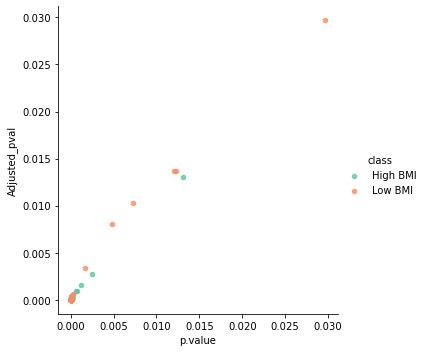

<Figure size 10000x800 with 0 Axes>

In [4]:
sns.lmplot(x='p.value',y='Adjusted_pval', data=data,hue='class', palette='Set2',fit_reg=False, scatter_kws={"s": 20})
plt.figure(figsize=(100,8), dpi= 100, facecolor='w', edgecolor='k')
plt.show()

In [5]:
data.head()

,Unnamed: 0,Assay,OlinkID,UniProt,Panel,term,df,sumsq,meansq,statistic,p.value,Adjusted_pval,Threshold,class,type
8,9,CCL8,OID05130,P80075,Olink COVID,Time,1,8.925178,8.925178,10.091571,0.013062,0.013062,Significant,High BMI,Real
19,20,CCL8,OID05130,P80075,Olink COVID,Time,1,16.748818,16.748818,25.976800,0.000263,0.000658,Significant,Low BMI,Real
20,21,CCL8,OID05130,P80075,Olink COVID,Time,1,21.258809,21.258809,27.251797,0.000031,0.000039,Significant,High BMI,Simulated
21,22,CCL8,OID05130,P80075,Olink COVID,Time,1,21.751677,21.751677,27.948650,0.000026,0.000033,Significant,High BMI,Simulated
22,23,CCL8,OID05130,P80075,Olink COVID,Time,1,22.552705,22.552705,31.524056,0.000012,0.000020,Significant,High BMI,Simulated


In [6]:
data.shape

(360, 15)

In [7]:
data

,Unnamed: 0,Assay,OlinkID,UniProt,Panel,term,df,sumsq,meansq,statistic,p.value,Adjusted_pval,Threshold,class,type
8,9,CCL8,OID05130,P80075,Olink COVID,Time,1,8.925178,8.925178,10.091571,1.306174e-02,1.306174e-02,Significant,High BMI,Real
19,20,CCL8,OID05130,P80075,Olink COVID,Time,1,16.748818,16.748818,25.976800,2.632228e-04,6.580571e-04,Significant,Low BMI,Real
20,21,CCL8,OID05130,P80075,Olink COVID,Time,1,21.258809,21.258809,27.251797,3.095211e-05,3.869014e-05,Significant,High BMI,Simulated
21,22,CCL8,OID05130,P80075,Olink COVID,Time,1,21.751677,21.751677,27.948650,2.639115e-05,3.298894e-05,Significant,High BMI,Simulated
22,23,CCL8,OID05130,P80075,Olink COVID,Time,1,22.552705,22.552705,31.524056,1.206360e-05,2.010600e-05,Significant,High BMI,Simulated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1057,1058,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,32.861901,32.861901,137.288309,1.576269e-18,1.550002e-17,Significant,Low BMI,Simulated
1058,1059,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,33.591378,33.591378,141.049909,8.167925e-19,8.167925e-18,Significant,Low BMI,Simulated
1059,1060,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,34.035038,34.035038,137.011590,1.655148e-18,1.655148e-17,Significant,Low BMI,Simulated
1060,1061,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,34.051968,34.051968,141.684975,7.318234e-19,7.318234e-18,Significant,Low BMI,Simulated


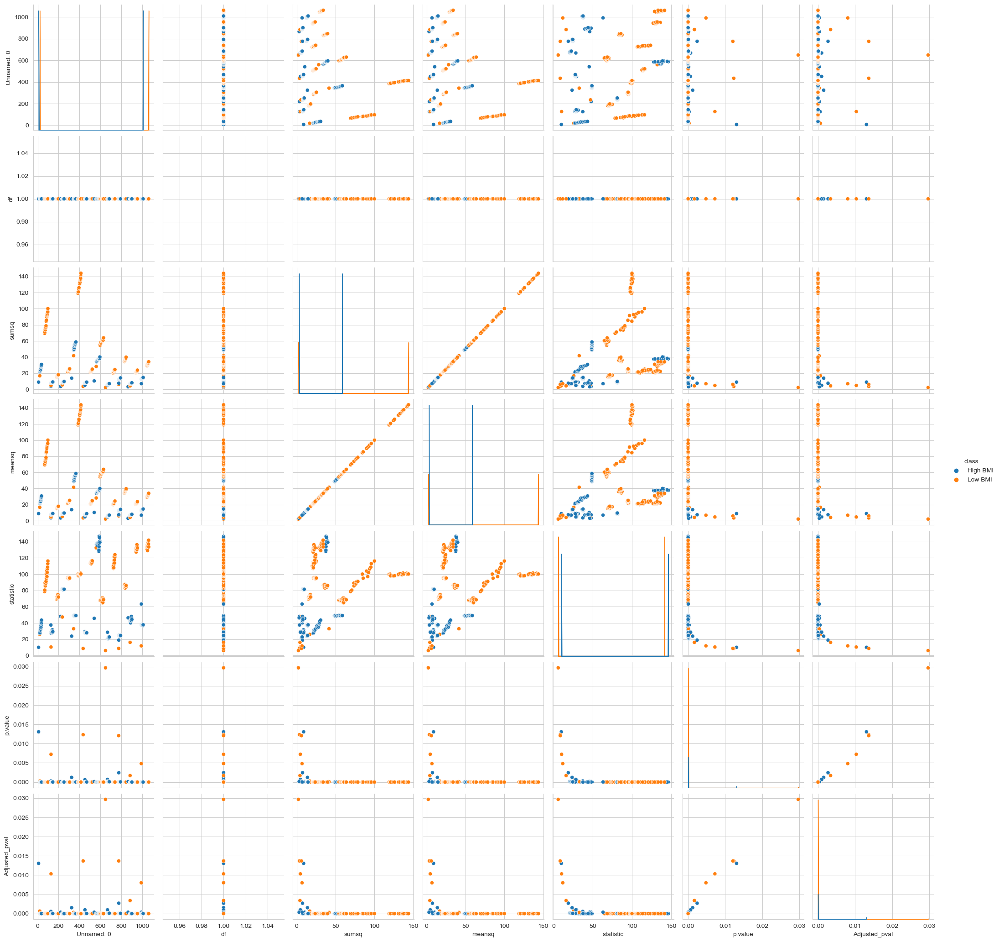

In [8]:
plt.close();
sns.set_style("whitegrid");
sns.pairplot(data, hue="class", height=3, diag_kws={'bw_adjust': 1e-5});
plt.show()

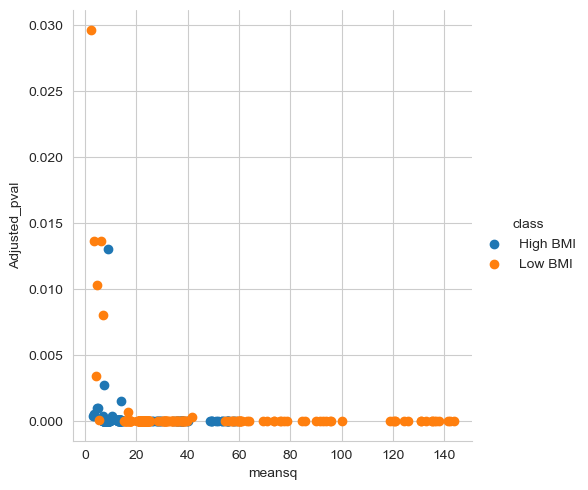

In [9]:
sns.set_style("whitegrid");
sns.FacetGrid(data, hue='class', height=5) \
.map(plt.scatter, "meansq", "Adjusted_pval") \
.add_legend();
plt.show()

In [10]:
data.insert(2, "Protein_name", data.Assay.values)
data.insert(12,"Class_name", data['class'].values)

#data.insert(14,"class names", data.Classif.values)

In [11]:
data

,Unnamed: 0,Assay,Protein_name,OlinkID,UniProt,Panel,term,df,sumsq,meansq,statistic,p.value,Class_name,Adjusted_pval,Threshold,class,type
8,9,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,8.925178,8.925178,10.091571,1.306174e-02,High BMI,1.306174e-02,Significant,High BMI,Real
19,20,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,16.748818,16.748818,25.976800,2.632228e-04,Low BMI,6.580571e-04,Significant,Low BMI,Real
20,21,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,21.258809,21.258809,27.251797,3.095211e-05,High BMI,3.869014e-05,Significant,High BMI,Simulated
21,22,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,21.751677,21.751677,27.948650,2.639115e-05,High BMI,3.298894e-05,Significant,High BMI,Simulated
22,23,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,22.552705,22.552705,31.524056,1.206360e-05,High BMI,2.010600e-05,Significant,High BMI,Simulated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1057,1058,SIGLEC1,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,32.861901,32.861901,137.288309,1.576269e-18,Low BMI,1.550002e-17,Significant,Low BMI,Simulated
1058,1059,SIGLEC1,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,33.591378,33.591378,141.049909,8.167925e-19,Low BMI,8.167925e-18,Significant,Low BMI,Simulated
1059,1060,SIGLEC1,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,34.035038,34.035038,137.011590,1.655148e-18,Low BMI,1.655148e-17,Significant,Low BMI,Simulated
1060,1061,SIGLEC1,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,34.051968,34.051968,141.684975,7.318234e-19,Low BMI,7.318234e-18,Significant,Low BMI,Simulated


In [12]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(data.Assay.unique())

le.transform(data.Assay.unique())
data['Assay'] = le.fit_transform(data.Assay.values)

le.fit(data.Class_name.unique())
data['Class_name'] = le.fit_transform(data.Class_name.values)
data

,Unnamed: 0,Assay,Protein_name,OlinkID,UniProt,Panel,term,df,sumsq,meansq,statistic,p.value,Class_name,Adjusted_pval,Threshold,class,type
8,9,0,CCL8,OID05130,P80075,Olink COVID,Time,1,8.925178,8.925178,10.091571,1.306174e-02,0,1.306174e-02,Significant,High BMI,Real
19,20,0,CCL8,OID05130,P80075,Olink COVID,Time,1,16.748818,16.748818,25.976800,2.632228e-04,1,6.580571e-04,Significant,Low BMI,Real
20,21,0,CCL8,OID05130,P80075,Olink COVID,Time,1,21.258809,21.258809,27.251797,3.095211e-05,0,3.869014e-05,Significant,High BMI,Simulated
21,22,0,CCL8,OID05130,P80075,Olink COVID,Time,1,21.751677,21.751677,27.948650,2.639115e-05,0,3.298894e-05,Significant,High BMI,Simulated
22,23,0,CCL8,OID05130,P80075,Olink COVID,Time,1,22.552705,22.552705,31.524056,1.206360e-05,0,2.010600e-05,Significant,High BMI,Simulated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1057,1058,9,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,32.861901,32.861901,137.288309,1.576269e-18,1,1.550002e-17,Significant,Low BMI,Simulated
1058,1059,9,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,33.591378,33.591378,141.049909,8.167925e-19,1,8.167925e-18,Significant,Low BMI,Simulated
1059,1060,9,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,34.035038,34.035038,137.011590,1.655148e-18,1,1.655148e-17,Significant,Low BMI,Simulated
1060,1061,9,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,34.051968,34.051968,141.684975,7.318234e-19,1,7.318234e-18,Significant,Low BMI,Simulated


In [13]:
y = data['class'].values

In [14]:
x = data[['Assay', 'Adjusted_pval']]

In [15]:
from sklearn.model_selection import cross_val_score
#---holds the cv (cross-validates) scores---
cv_scores = []
#---use all features---
x = data[['Assay', 'Adjusted_pval']].values
y = data['class'].values

from sklearn.preprocessing import StandardScaler, RobustScaler
scaler = RobustScaler()
scaler.fit(x)

x = scaler.transform(x)


#---number of folds---
folds = 10
#---creating odd list of K for KNN---
ks = list(range(1,int(len(x) * ((folds - 1)/folds))))
#---remove all multiples of 3---
ks = [k for k in ks] # if k % 3 != 0]
#---perform k-fold cross validation---
for k in ks:
    knn = KNeighborsClassifier(n_neighbors=k)
    #---performs cross-validation and returns the average accuracy---
    scores = cross_val_score(knn, x, y, cv=folds, scoring='accuracy')
    mean = scores.mean()
    cv_scores.append(mean)
    print(k, mean)
    

1 0.8083333333333332
2 0.8472222222222221
3 0.8527777777777779
4 0.85
5 0.85
6 0.85
7 0.85
8 0.8388888888888888
9 0.8416666666666666
10 0.8388888888888889
11 0.836111111111111
12 0.8333333333333334
13 0.8333333333333334
14 0.8333333333333334
15 0.8305555555555555
16 0.8305555555555555
17 0.8277777777777778
18 0.8277777777777778
19 0.825
20 0.825
21 0.825
22 0.825
23 0.825
24 0.825
25 0.825
26 0.825
27 0.8194444444444444
28 0.8194444444444444
29 0.8166666666666667
30 0.8166666666666667
31 0.8083333333333332
32 0.8083333333333332
33 0.8083333333333332
34 0.7916666666666667
35 0.7222222222222222
36 0.7222222222222222
37 0.7194444444444444
38 0.7194444444444444
39 0.7166666666666667
40 0.7166666666666667
41 0.7166666666666667
42 0.7166666666666667
43 0.7138888888888889
44 0.7138888888888889
45 0.7138888888888889
46 0.7138888888888889
47 0.7138888888888889
48 0.7138888888888889
49 0.7138888888888889
50 0.7138888888888889
51 0.7138888888888889
52 0.7138888888888889
53 0.7138888888888889
54 0

The optimal number of neighbors is 3


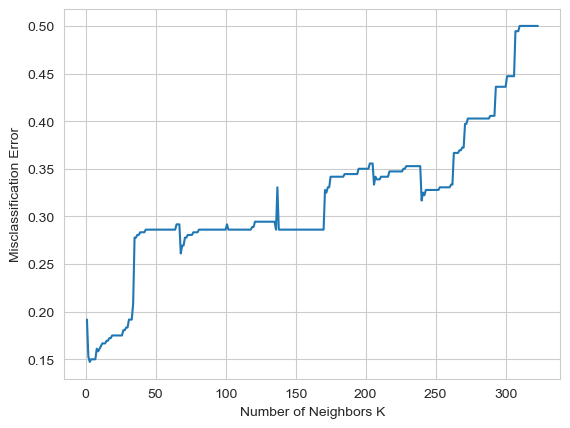

In [16]:
#---calculate misclassification error for each k---
MSE = [1 - x for x in cv_scores]

#---determining best k (min. MSE)---
optimal_k = ks[MSE.index(min(MSE))]
print(f"The optimal number of neighbors is {optimal_k}")

#---plot misclassification error vs k---
plt.plot(ks, MSE)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()

In [17]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y , test_size=0.2, random_state=2)
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score, log_loss

from sklearn.preprocessing import StandardScaler, RobustScaler
scaler = RobustScaler()
scaler.fit(x_train)

x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)


knn=KNeighborsClassifier(optimal_k)
knn.fit(x_train, y_train)
ypred=knn.predict(x_test) #These are the predicted output values
result = confusion_matrix(y_test, ypred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, ypred)
print("Classification Report:")
print(result1)
result2 = accuracy_score(y_test,ypred)
print("Accuracy:",result2)



Confusion Matrix:
[[38  0]
 [ 1 33]]
Classification Report:
              precision    recall  f1-score   support

    High BMI       0.97      1.00      0.99        38
     Low BMI       1.00      0.97      0.99        34

    accuracy                           0.99        72
   macro avg       0.99      0.99      0.99        72
weighted avg       0.99      0.99      0.99        72

Accuracy: 0.9861111111111112


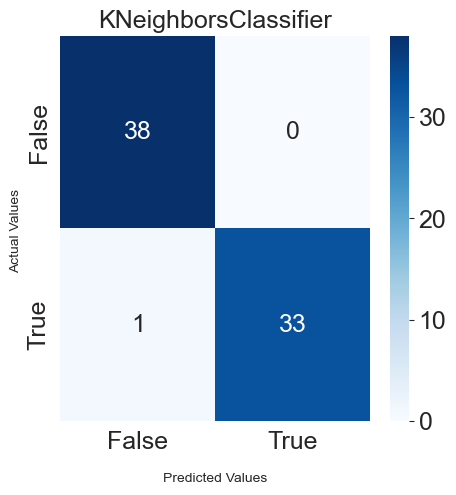

In [18]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(knn.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

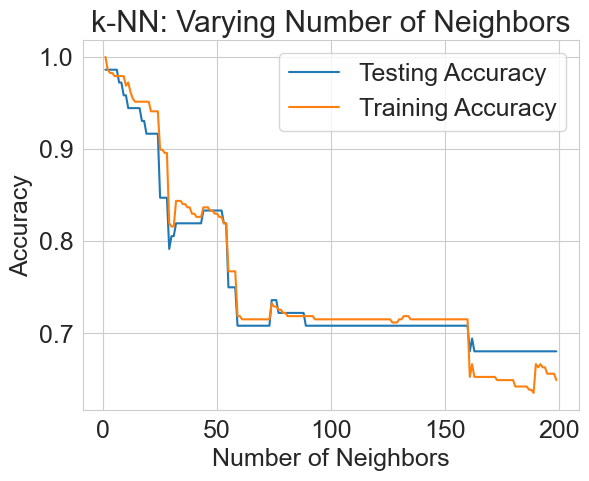

In [19]:
no_neighbors = np.arange(1, 200)
train_accuracy = np.empty(len(no_neighbors))
test_accuracy = np.empty(len(no_neighbors))

for i, k in enumerate(no_neighbors):
    # We instantiate the classifier
    knn = KNeighborsClassifier(n_neighbors=k)
    # Fit the classifier to the training data
    knn.fit(x_train,y_train)
    # Compute accuracy on the training set
    train_accuracy[i] = knn.score(x_train, y_train)
    #print(train_accuracy[i])
    # Compute accuracy on the testing set
    test_accuracy[i] = knn.score(x_test, y_test)
    #print(test_accuracy[i])

# Visualization of k values vs accuracy

plt.title('k-NN: Varying Number of Neighbors')
plt.plot(no_neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(no_neighbors, train_accuracy, label = 'Training Accuracy')
plt.legend()
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.show()

### https://askdatascience.com/777/score-vs-accuracyscore-in-sklearn

In [20]:
#Transformar para ROC e AUC funcionarem
y_test_roc = y_test
y_test_roc = np.where(y_test == 'High BMI', 1, y_test_roc)
y_test_roc = np.where(y_test == 'Low BMI', -1, y_test_roc)
y_test_roc = y_test_roc.astype(int)

In [21]:
from sklearn.metrics import roc_curve, auc
#---find the predicted probabilities using the test set
probs = knn.predict_proba(x_test)
preds = probs[:,1]
#---find the FPR, TPR, and threshold---
fpr, tpr, threshold = roc_curve(y_test_roc, preds)

ll = log_loss(y_test_roc, probs)
print("Log Loss: {}".format(ll))

Log Loss: 0.8260074232627221


In [22]:
print("FPR:",fpr)
print("TPR:",tpr)
print("THRESHOLD",threshold)

FPR: [0.         0.11764706 0.17647059 0.55882353 0.55882353 0.55882353
 0.61764706 0.61764706 0.82352941 0.97058824 0.97058824 0.97058824
 0.97058824 0.97058824 0.97058824 0.97058824 1.        ]
TPR: [0.         0.         0.         0.13157895 0.21052632 0.23684211
 0.28947368 0.39473684 0.42105263 0.44736842 0.5        0.57894737
 0.71052632 0.86842105 0.94736842 1.         1.        ]
THRESHOLD [1.69346734 0.69346734 0.66834171 0.65829146 0.65326633 0.64824121
 0.63819095 0.63316583 0.62311558 0.61809045 0.54773869 0.53768844
 0.41708543 0.4120603  0.40201005 0.39698492 0.31155779]


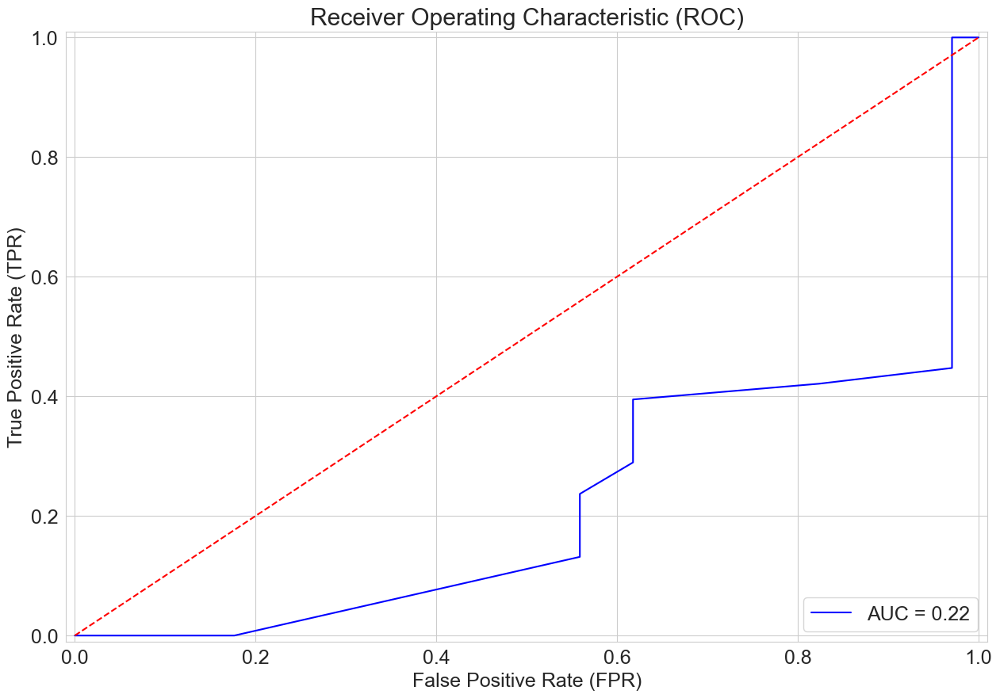

In [23]:
#---find the area under the curve---
roc_auc = auc(fpr, tpr)
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (15,10)
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.ylabel('True Positive Rate (TPR)')
plt.xlabel('False Positive Rate (FPR)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc = 'lower right')
plt.show()

### Probability Estimates with go.Contour: <i>import plotly.graph_objects as go</i>
Just like the previous example, we will first train our kNN model on the training set.

Instead of predicting the conference for the test set, we can predict the confidence map for the entire area that wraps around the dimensions of our dataset. To do this, we use np.meshgrid to create a grid, where the distance between each point is denoted by the mesh_size variable.

Then, for each of those points, we will use our model to give a confidence score, and plot it with a contour plot.
In this example, we will use graph objects, Plotly's low-level API for building figures.

In [24]:
# Create a mesh grid on which we will run our model
import plotly.graph_objects as go
mesh_size = .3
margin = 0.25
x_min, x_max = x[:, 0].min() - margin, x[:, 0].max() + margin
y_min, y_max = x[:, 1].min() - margin, x[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)


Z = knn.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)


# Plot the figure
fig = go.Figure(data=[
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        colorscale='RdBu'
    )
])
fig.show()

### GradientBoostingClassifier

In [25]:
# Logging for Visual Comparison
log_cols=["Classifier", "Accuracy", "Log Loss"]
log = pd.DataFrame(columns=log_cols)

log_entry = pd.DataFrame([[knn.__class__.__name__, result2*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier

clf = GradientBoostingClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))


log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 98.6111%
Log Loss: 0.08344087569800217


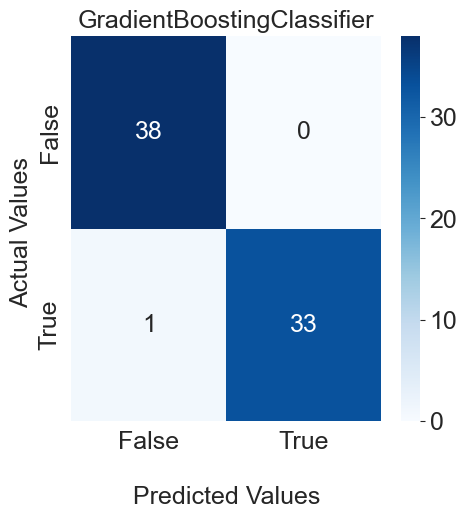

In [26]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### RandomForestClassifier

In [27]:
clf = RandomForestClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn.tree import plot_tree

fig = plt.figure(figsize=(150, 100))
plot_tree(clf.estimators_[0], 
          feature_names=x_train,
          class_names=y_test, 
          filled=True, impurity=True, 
          rounded=True)

****Results****
Accuracy: 98.6111%
[[38  0]
 [ 1 33]]
Log Loss: 0.049561573625529716


[Text(0.5, 0.9285714285714286, '[-1.00000000e+00 -3.06146942e-05] <= -0.0\ngini = 0.5\nsamples = 182\nvalue = [143, 145]\nclass = Low BMI'),
 Text(0.3333333333333333, 0.7857142857142857, 'gini = 0.0\nsamples = 88\nvalue = [0, 137]\nclass = Low BMI'),
 Text(0.6666666666666666, 0.7857142857142857, '[-1.00000000e+00 -3.06146942e-05] <= 149.113\ngini = 0.1\nsamples = 94\nvalue = [143, 8]\nclass = High BMI'),
 Text(0.5, 0.6428571428571429, '[-2.00000000e-01 -3.06146914e-05] <= -0.5\ngini = 0.053\nsamples = 91\nvalue = [143, 4]\nclass = High BMI'),
 Text(0.3333333333333333, 0.5, '[-1.00000000e+00 -3.06146942e-05] <= 3.028\ngini = 0.169\nsamples = 29\nvalue = [39, 4]\nclass = High BMI'),
 Text(0.16666666666666666, 0.35714285714285715, 'gini = 0.0\nsamples = 25\nvalue = [37, 0]\nclass = High BMI'),
 Text(0.5, 0.35714285714285715, '[-1.00000000e+00 -3.06146942e-05] <= 10.904\ngini = 0.444\nsamples = 4\nvalue = [2, 4]\nclass = Low BMI'),
 Text(0.3333333333333333, 0.21428571428571427, 'gini = 0.0

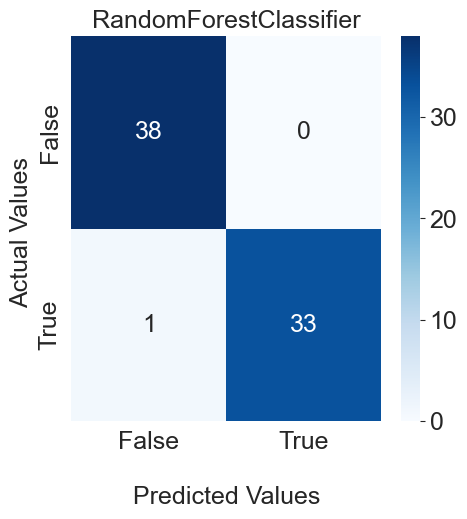

In [28]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### AdaBoostClassifier

In [29]:
clf = AdaBoostClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn.tree import plot_tree

fig = plt.figure(figsize=(150, 100))
plot_tree(clf.estimators_[0], 
          feature_names=x_train,
          class_names=y_test, 
          filled=True, impurity=True, 
          rounded=True)

****Results****
Accuracy: 98.6111%
Log Loss: 0.5248190822383576


[Text(0.5, 0.75, '[-1.00000000e+00 -3.06146942e-05] <= -0.0\ngini = 0.5\nsamples = 288\nvalue = [0.493, 0.507]\nclass = Low BMI'),
 Text(0.25, 0.25, 'gini = 0.0\nsamples = 137\nvalue = [0.0, 0.476]\nclass = Low BMI'),
 Text(0.75, 0.25, 'gini = 0.112\nsamples = 151\nvalue = [0.493, 0.031]\nclass = High BMI')]

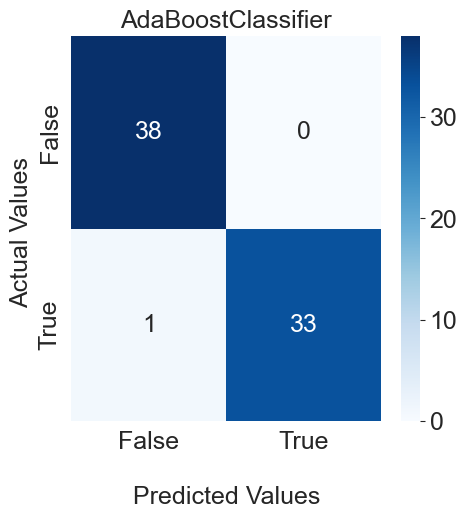

In [30]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### DecisionTreeClassifier

****Results****
Accuracy: 98.6111%
Log Loss: 0.47970522770709384


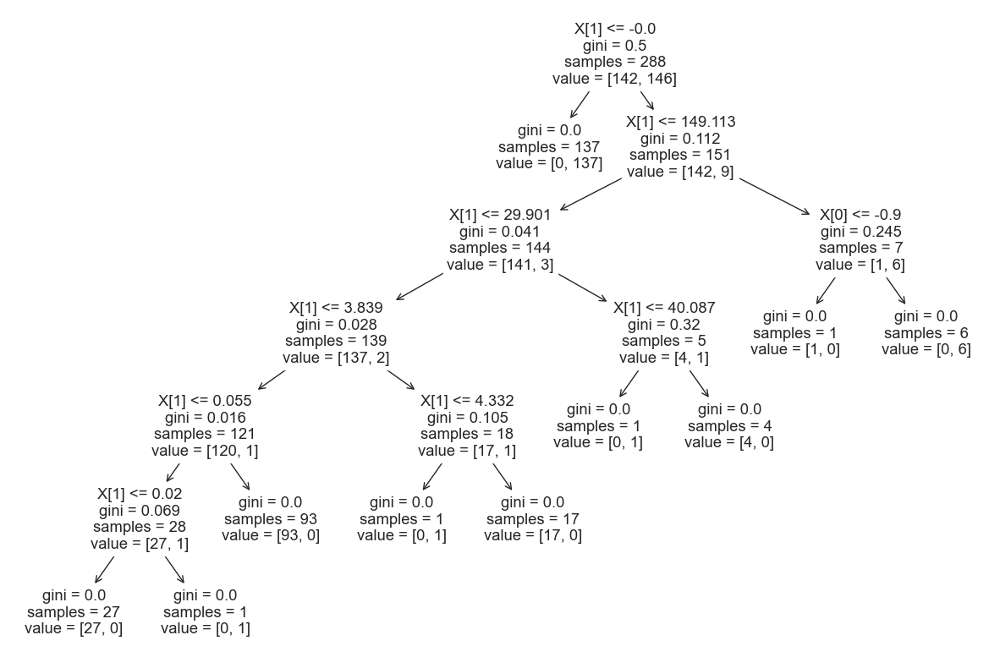

In [31]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn import tree
tree.plot_tree(clf)
plt.show()

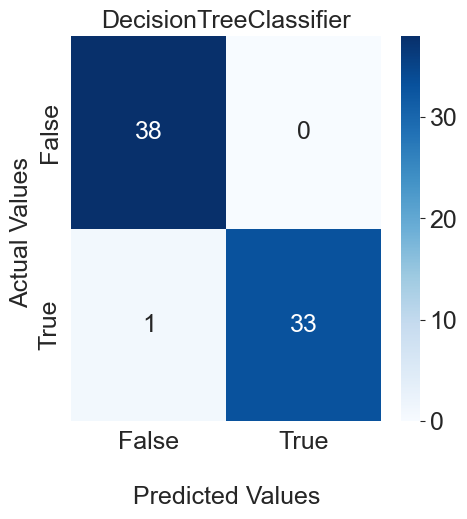

In [32]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### SVC

In [33]:
from sklearn.svm import SVC, LinearSVC, NuSVC
clf = SVC(kernel="rbf", C=0.025, probability=True)
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 47.2222%
Log Loss: 0.6916854869575668


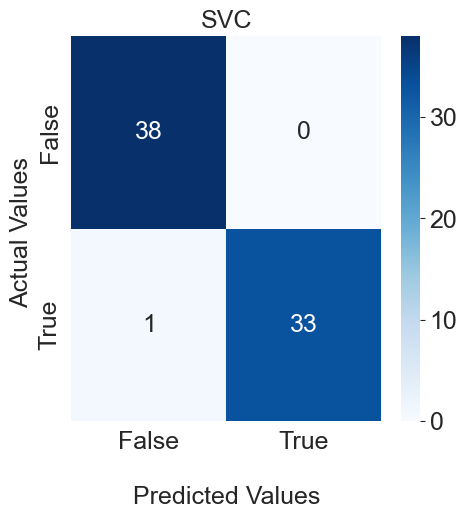

In [34]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### NuSVC

In [35]:
from sklearn.svm import SVC, NuSVC
clf = NuSVC(probability=True)
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 58.3333%
Log Loss: 0.6936697386183661


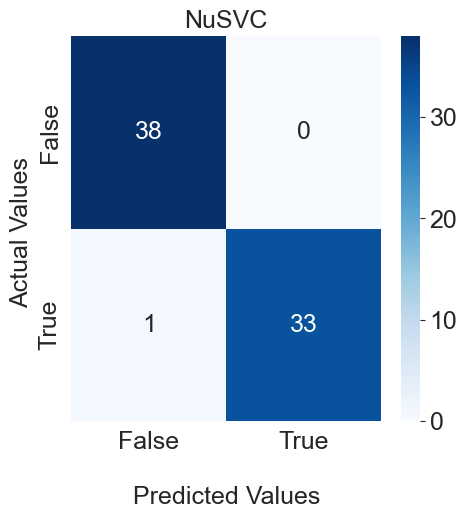

In [36]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### LinearDiscriminantAnalysis

In [37]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
clf = LinearDiscriminantAnalysis()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 41.6667%
Log Loss: 0.7042994308477117


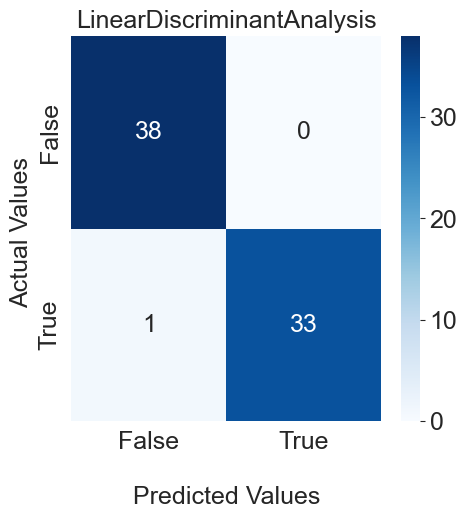

In [38]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### GaussianNB

In [39]:
from sklearn.naive_bayes import GaussianNB
clf = GaussianNB()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 52.7778%
Log Loss: 0.7966237161175856


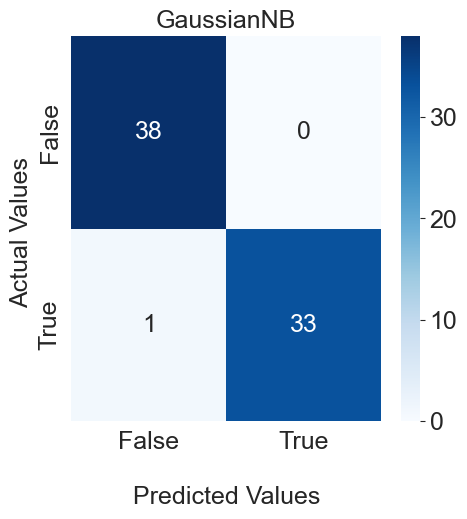

In [40]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### Logistic Regression

In [41]:
from sklearn import linear_model

clf = linear_model.LogisticRegression(max_iter=50)
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 41.6667%
Log Loss: 0.7040030483719454


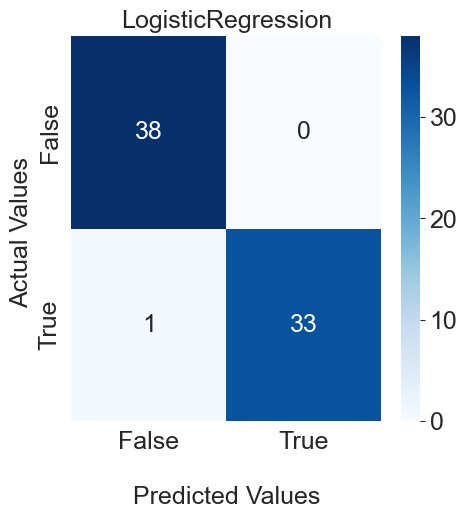

In [42]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### MLPClassifier

In [43]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(max_iter=3000)
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 86.1111%
Log Loss: 0.3847517346525889


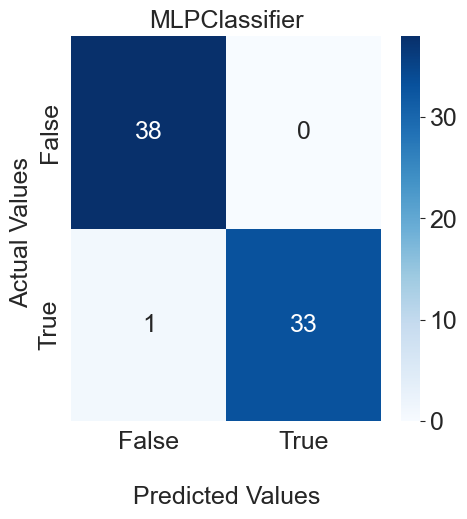

In [44]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### BaggingClassifier

In [45]:
from sklearn.ensemble import BaggingClassifier
clf = BaggingClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn.tree import plot_tree

fig = plt.figure(figsize=(150, 100))
plot_tree(clf.estimators_[0], 
          feature_names=x_train,
          class_names=y_test, 
          filled=True, impurity=True, 
          rounded=True)

****Results****
Accuracy: 98.6111%
Log Loss: 0.47970522770709384


[Text(0.5555555555555556, 0.9166666666666666, '[-1.00000000e+00 -3.06146942e-05] <= -0.0\ngini = 0.5\nsamples = 184\nvalue = [144, 144]\nclass = High BMI'),
 Text(0.4444444444444444, 0.75, 'gini = 0.0\nsamples = 90\nvalue = [0, 138]\nclass = Low BMI'),
 Text(0.6666666666666666, 0.75, '[-1.00000000e+00 -3.06146942e-05] <= 318.308\ngini = 0.077\nsamples = 94\nvalue = [144, 6]\nclass = High BMI'),
 Text(0.5555555555555556, 0.5833333333333334, '[-1.00000000e+00 -3.06146942e-05] <= 29.901\ngini = 0.027\nsamples = 92\nvalue = [144, 2]\nclass = High BMI'),
 Text(0.3333333333333333, 0.4166666666666667, '[-1.00000000e+00 -3.06146942e-05] <= 0.055\ngini = 0.014\nsamples = 89\nvalue = [140, 1]\nclass = High BMI'),
 Text(0.2222222222222222, 0.25, '[-1.00000000e+00 -3.06146942e-05] <= 0.02\ngini = 0.077\nsamples = 18\nvalue = [24, 1]\nclass = High BMI'),
 Text(0.1111111111111111, 0.08333333333333333, 'gini = 0.0\nsamples = 17\nvalue = [24, 0]\nclass = High BMI'),
 Text(0.3333333333333333, 0.0833333

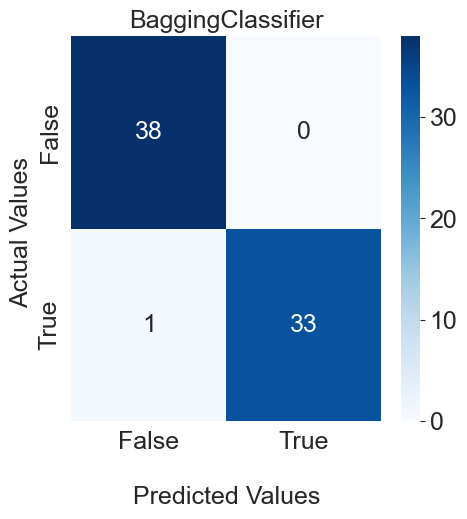

In [46]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### HistGradientBoostingClassifier

In [47]:
from sklearn.ensemble import HistGradientBoostingClassifier
clf = HistGradientBoostingClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])



****Results****
Accuracy: 98.6111%
Log Loss: 0.03248675827539144


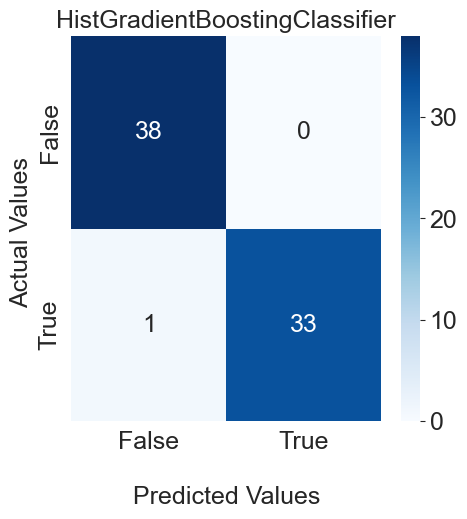

In [48]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### ExtraTreesClassifier

In [49]:
from sklearn.ensemble import ExtraTreesClassifier
clf = ExtraTreesClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn.tree import plot_tree

fig = plt.figure(figsize=(150, 100))
plot_tree(clf.estimators_[0], 
          feature_names=x_train,
          class_names=y_test, 
          filled=True, impurity=True, 
          rounded=True)

****Results****
Accuracy: 98.6111%
Log Loss: 0.04981856628614857


[Text(0.7864583333333334, 0.9615384615384616, '[-1.00000000e+00 -3.06146942e-05] <= 1286.51\ngini = 0.5\nsamples = 288\nvalue = [142, 146]\nclass = Low BMI'),
 Text(0.7447916666666666, 0.8846153846153846, '[-1.00000000e+00 -3.06146942e-05] <= 246.664\ngini = 0.5\nsamples = 287\nvalue = [142, 145]\nclass = Low BMI'),
 Text(0.6145833333333334, 0.8076923076923077, '[-1.00000000e+00 -3.06146942e-05] <= 43.542\ngini = 0.5\nsamples = 282\nvalue = [141, 141]\nclass = High BMI'),
 Text(0.4791666666666667, 0.7307692307692307, '[-1.00000000e+00 -3.06146942e-05] <= 11.386\ngini = 0.5\nsamples = 277\nvalue = [137, 140]\nclass = Low BMI'),
 Text(0.3333333333333333, 0.6538461538461539, '[-1.00000000e+00 -3.06146942e-05] <= 0.41\ngini = 0.5\nsamples = 271\nvalue = [132, 139]\nclass = Low BMI'),
 Text(0.25, 0.5769230769230769, '[-1.00000000e+00 -3.06146942e-05] <= 0.089\ngini = 0.453\nsamples = 211\nvalue = [73, 138]\nclass = Low BMI'),
 Text(0.20833333333333334, 0.5, '[-2.00000000e-01 -3.06146914e-05

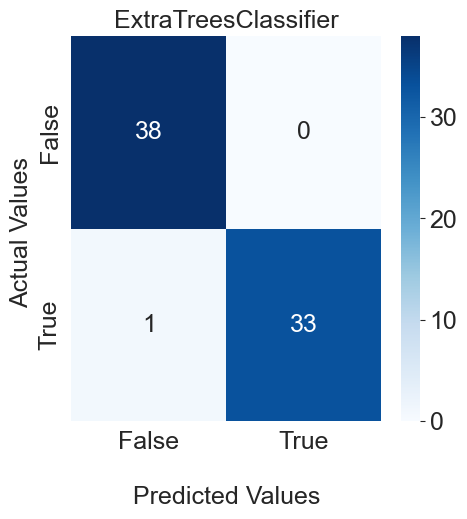

In [50]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### Comparação entre classificadores

In [51]:
log.to_csv('log_BMI.csv')
log

,Classifier,Accuracy,Log Loss
0,ExtraTreesClassifier,98.611111,0.049819
0,HistGradientBoostingClassifier,98.611111,0.032487
0,BaggingClassifier,98.611111,0.479705
0,MLPClassifier,86.111111,0.384752
0,LogisticRegression,41.666667,0.704003
0,GaussianNB,52.777778,0.796624
0,LinearDiscriminantAnalysis,41.666667,0.704299
0,NuSVC,58.333333,0.693670
0,SVC,47.222222,0.691685
0,DecisionTreeClassifier,98.611111,0.479705


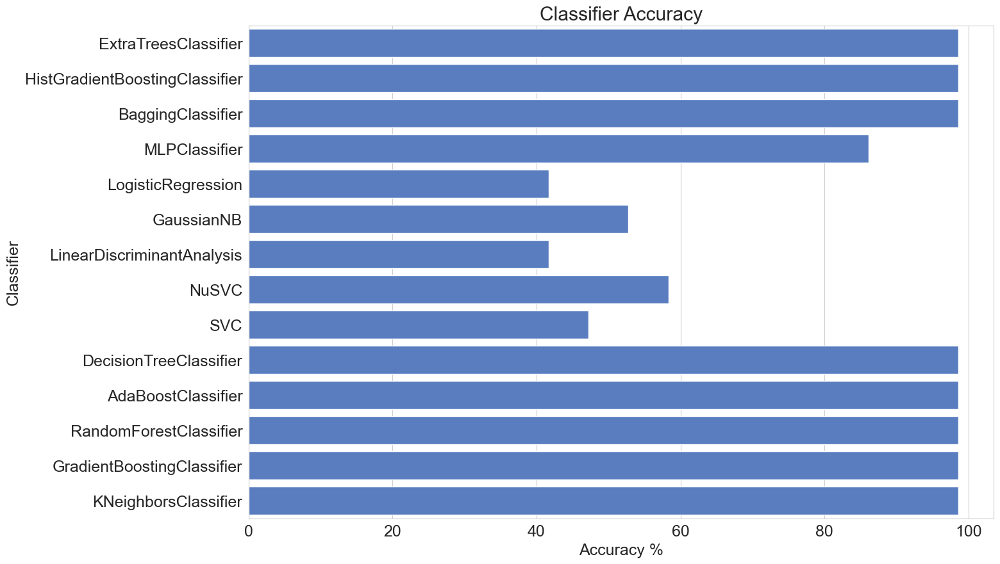

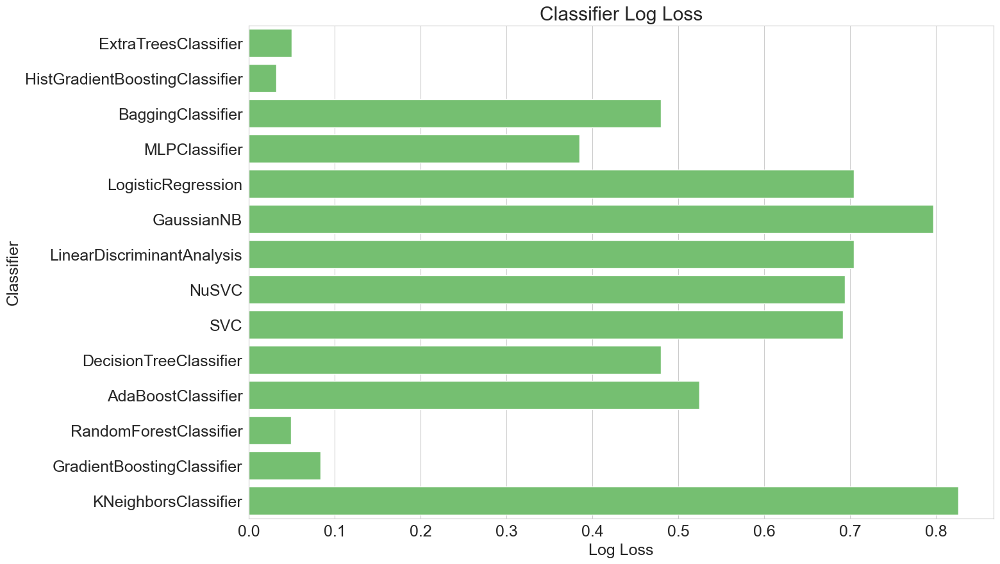

In [52]:
sns.set_color_codes("muted")
sns.barplot(x='Accuracy', y='Classifier', data=log, color="b")

plt.xlabel('Accuracy %')
plt.title('Classifier Accuracy')
plt.show()

sns.set_color_codes("muted")
sns.barplot(x='Log Loss', y='Classifier', data=log, color="g")

plt.xlabel('Log Loss')
plt.title('Classifier Log Loss')
plt.show()